# Binary classification

## 20% test, 80% train со cross validation на train, скалирање на податоците сокористење на robust scalling, feature selection и трансформација на распределба на податоците со yeo-johnson - Attack (0-attack,1-normal)

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from imblearn.metrics import specificity_score
from scipy import stats
from scipy.stats import shapiro
from sklearn.metrics import classification_report
from sklearn.feature_selection import mutual_info_classif

In [3]:
from pycaret.classification import*

In [4]:
data = pd.read_csv('InSDN.csv')

In [5]:
data['Attack'] =data['Label'].apply(lambda x: 0 if x == 'Normal' else 1)

# Број на примероци во класите

In [5]:
def get_percentage_cnt(df, col):   
    t1 = pd.DataFrame(df.groupby(col)[col].count().rename('cnt%'))
    t1.reset_index(inplace=True)
    t1['cnt%'] = round((t1['cnt%'] * 100) / t1['cnt%'].sum(),2)
    return t1

def myplot(x, y, df):
    ax = sns.barplot(x=x, y=y, data=df)
    for p in ax.patches:
        ax.annotate('{0:.1f}%'.format(p.get_height()), (p.get_x()+0.1, p.get_height()))

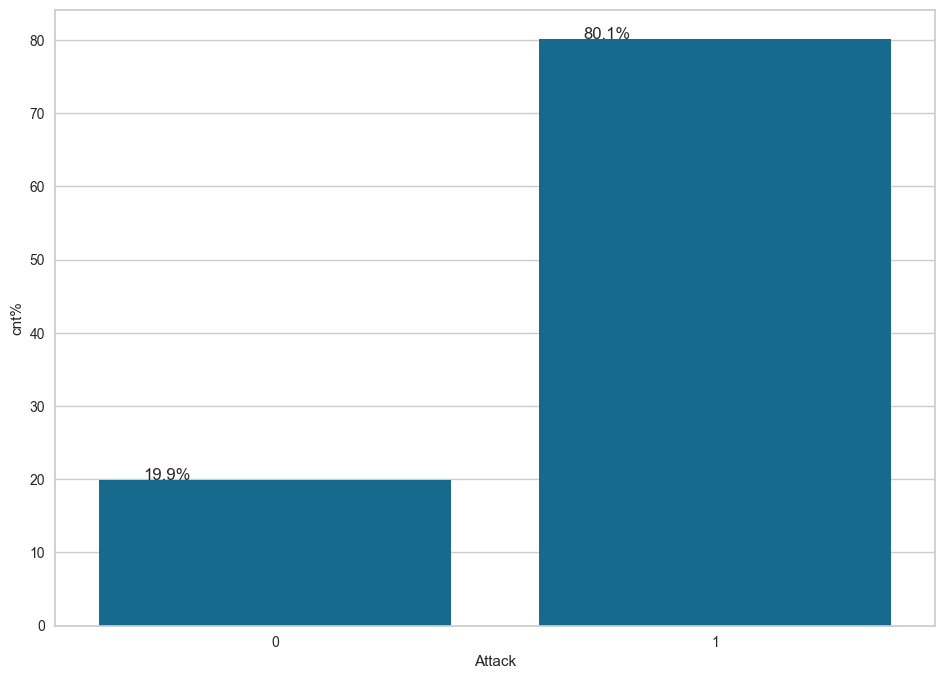

In [6]:
plt.figure(figsize=(25,8))

dual_categories = ['Attack']
plt_cnt = 1
for feature in dual_categories:
    plt.subplot(1,2,plt_cnt)
    tempdf = get_percentage_cnt(data, feature)
    myplot(feature, 'cnt%', tempdf)
    plt_cnt += 1

plt.show()

In [7]:
data['Attack'].value_counts()

1    275465
0     68424
Name: Attack, dtype: int64

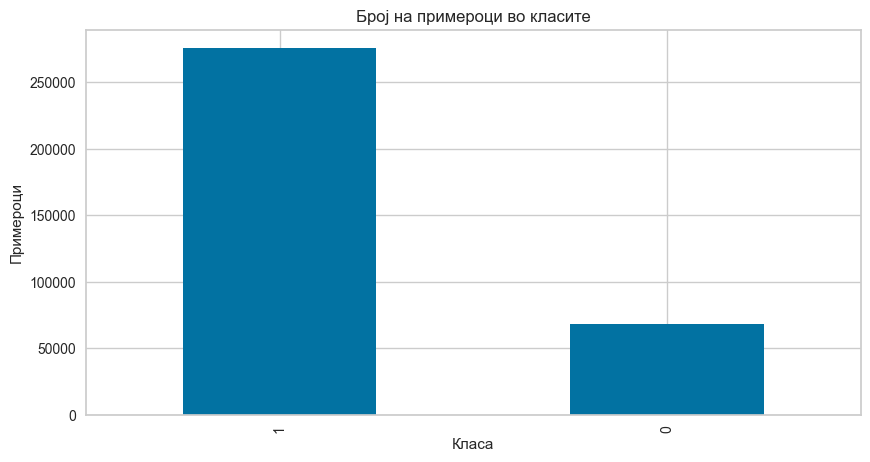

In [8]:
plt.figure(figsize=(10, 5))
data['Attack'].value_counts().plot(kind='bar')
plt.title("Број на примероци во класите")
plt.xlabel("Класа")
plt.ylabel("Примероци")
plt.show()

In [9]:
data.head()

,Flow ID,Src IP,Src Port,Dst IP,Dst Port,Protocol,Timestamp,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,...,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label,Attack
0,165.187.81.122-192.168.3.130-0-0-0,165.187.81.122,0,192.168.3.130,0,0,10/1/2020 5:57,62,0,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,DDoS,1
1,192.168.20.133-213.19.162.100-51034-443-6,192.168.20.133,51034,213.19.162.100,443,6,4/2/2020 18:27,634,1,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Normal,0
2,192.168.20.134-200.175.2.130-80-45354-6,200.175.2.130,45354,192.168.20.134,80,6,27/12/2019 05:04:14 PM,312260,3,6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,DoS,1
3,192.168.20.134-200.175.2.130-80-42274-6,200.175.2.130,42274,192.168.20.134,80,6,27/12/2019 04:44:42 PM,20015,2,5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,DoS,1
4,192.168.20.133-192.168.20.2-51188-53-17,192.168.20.133,51188,192.168.20.2,53,17,5/2/2020 13:59,5283,1,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Normal,0


# Карактеристики - мрежни идентификатори (се менуваат од мрежа до мрежа и за подобра генерализација се отфрлени)

In [6]:
data.drop('Flow ID',axis=1,inplace=True)
data.drop('Src IP',axis=1,inplace=True)
data.drop('Dst IP',axis=1,inplace=True)
data.drop('Timestamp',axis=1,inplace=True)
data.drop('Label',axis=1,inplace=True)

In [11]:
y = data['Attack']

# Матрица на корелација

In [12]:
X = data.iloc[:, :-1]

In [13]:
X.head()

,Src Port,Dst Port,Protocol,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,TotLen Fwd Pkts,TotLen Bwd Pkts,Fwd Pkt Len Max,Fwd Pkt Len Min,...,Fwd Act Data Pkts,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
0,0,0,0,62,0,2,0.0,0.0,0,0,...,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,51034,443,6,634,1,1,0.0,53.0,0,0,...,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,45354,80,6,312260,3,6,708.0,1882.0,354,0,...,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,42274,80,6,20015,2,5,270.0,380.0,270,0,...,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,51188,53,17,5283,1,3,38.0,776.0,38,38,...,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<Axes: >

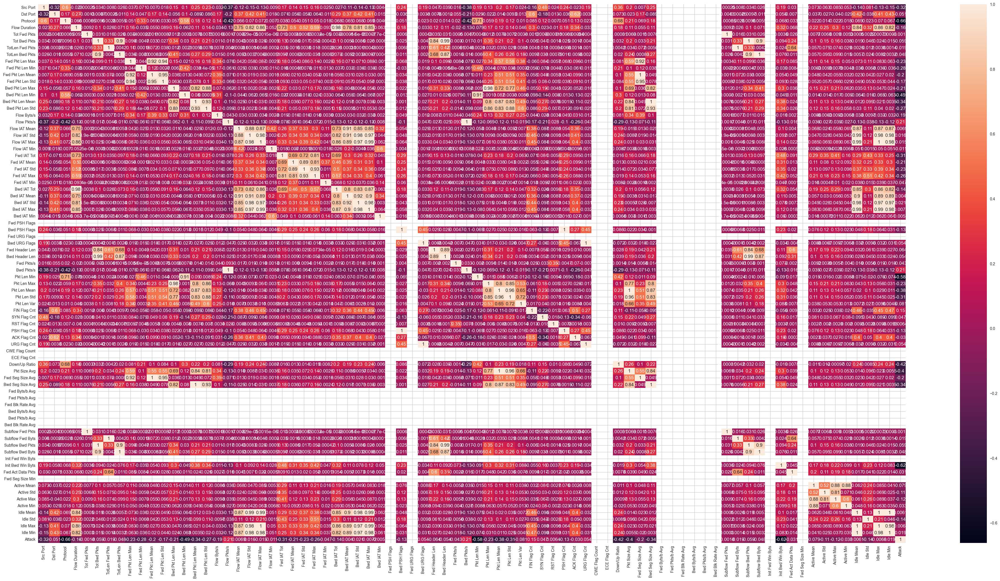

In [14]:
plt.figure(figsize=(50,25))
sns.heatmap(data.corr(),annot=True)

([0, 1], [Text(0, 0, '0'), Text(1, 0, '1')])

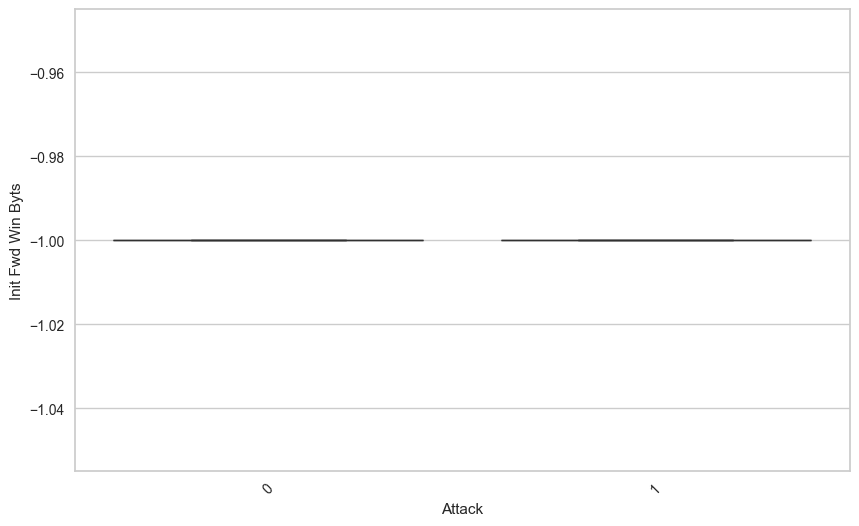

In [15]:
plt.figure(figsize = (10, 6))
ax = sns.boxplot(x='Attack', y='Init Fwd Win Byts', data=data)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(rotation=45)

# Отстранување на карактеристики со константни вредности

In [16]:
unique_counts = data.nunique()

In [17]:
constant_cols = unique_counts[unique_counts < 2].index
constant_cols

Index(['Fwd PSH Flags', 'Fwd URG Flags', 'CWE Flag Count', 'ECE Flag Cnt',
       'Fwd Byts/b Avg', 'Fwd Pkts/b Avg', 'Fwd Blk Rate Avg',
       'Bwd Byts/b Avg', 'Bwd Pkts/b Avg', 'Bwd Blk Rate Avg',
       'Init Fwd Win Byts', 'Fwd Seg Size Min'],
      dtype='object')

In [7]:
data.drop("Fwd PSH Flags", axis=1, inplace=True)
data.drop("Fwd URG Flags", axis=1, inplace=True)
data.drop("CWE Flag Count", axis=1, inplace=True)
data.drop("ECE Flag Cnt", axis=1, inplace=True)
data.drop("Fwd Byts/b Avg", axis=1, inplace=True)
data.drop("Fwd Pkts/b Avg", axis=1, inplace=True)
data.drop("Fwd Blk Rate Avg", axis=1, inplace=True)
data.drop("Bwd Byts/b Avg", axis=1, inplace=True)
data.drop("Bwd Pkts/b Avg", axis=1, inplace=True)
data.drop("Bwd Blk Rate Avg", axis=1, inplace=True)
data.drop("Init Fwd Win Byts", axis=1, inplace=True)
data.drop("Fwd Seg Size Min", axis=1, inplace=True)

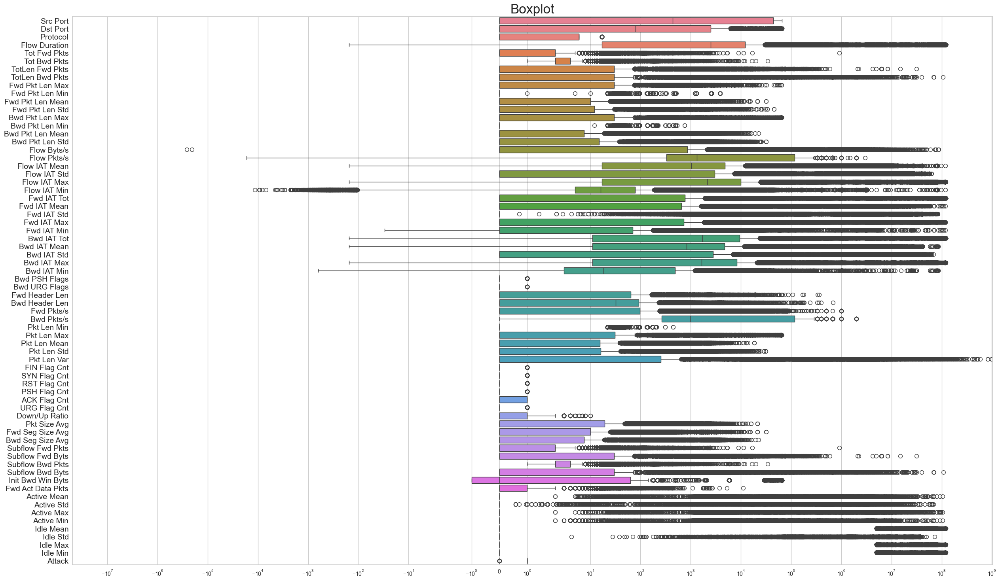

In [19]:
plt.figure(figsize=(30, 18))
sns.boxplot(data, orient="h")
plt.title('Boxplot', fontsize=24)
plt.yticks(fontsize=14)
plt.xscale('symlog')
plt.show()

# DBSCAN за детектирање на outliers

In [9]:
from sklearn.cluster import DBSCAN

In [10]:
dbscan = DBSCAN(eps=0.3, min_samples=5)

In [11]:
X = data.iloc[:, :-1]

In [13]:
dbscan.fit(X)

DBSCAN(eps=0.3)

In [14]:
outlier_mask = dbscan.labels_ == -1

In [15]:
labels1 = dbscan.labels_
outliers = np.where(labels1 == -1)[0]
print("Број на outliers:", len(outliers))

Број на outliers: 223570


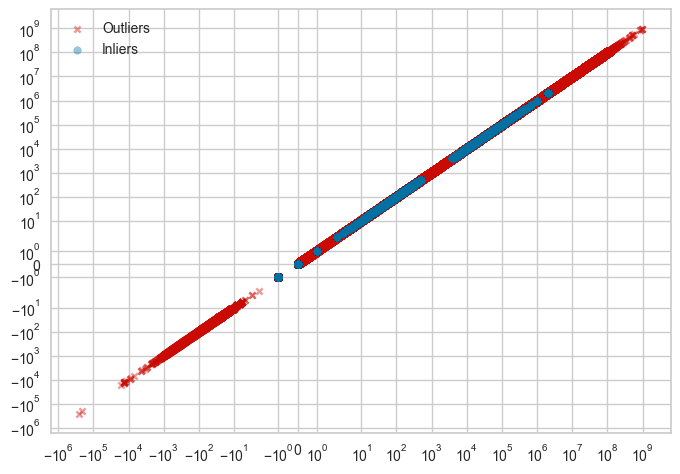

In [16]:
plt.xscale('symlog')
plt.yscale('symlog')
plt.scatter(X[outlier_mask], X[outlier_mask], c='r', marker='x', label='Outliers', alpha=0.4, s=20)
plt.scatter(X[~outlier_mask], X[~outlier_mask], c='b', marker='o', label='Inliers', alpha=0.4, s=30)
plt.legend()
plt.show()

Одредени карактеристики не може да имаат негативни вредности па се заменуваат со 0. Овие негативни вредности се застапени во нормалниот сообраќај и не се вредности како резултат на некој абнормален случај на напад и затоа се претпоставува дека се грешки при мерење односно при собирање на податоци. Вредностите помали од нула претставуваат outliers, но не може да се отстранат зошто на тој начин би се отстранила редица во податоците која можеби содржи важни информации за останататите карактеристики. Затоа тие вредности ги заменувам со 0. 

In [17]:
columns = ['Flow Duration', 'Flow Byts/s', 'Flow Pkts/s','Flow IAT Max','Flow IAT Min','Flow IAT Mean','Fwd IAT Min','Bwd IAT Tot','Bwd IAT Max','Bwd IAT Min','Bwd IAT Mean']

In [18]:
for column in columns:
    data[column] = data[column].apply(lambda x: max(0, x))

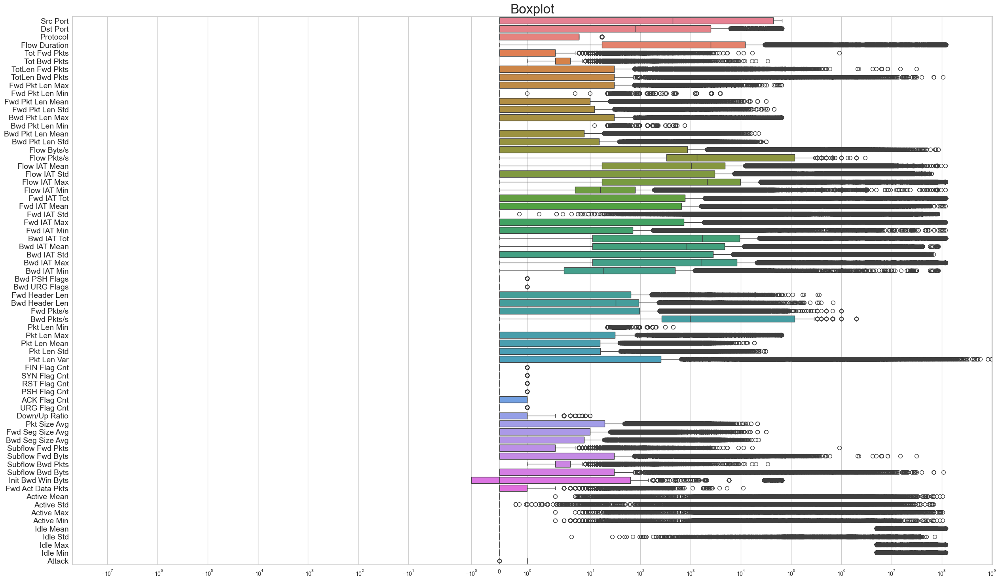

In [19]:
plt.figure(figsize=(30, 18))
sns.boxplot(data, orient="h")
plt.title('Boxplot', fontsize=24)
plt.yticks(fontsize=14)
plt.xscale('symlog')
plt.show()

In [20]:
X = data.iloc[:, :-1]

<Axes: >

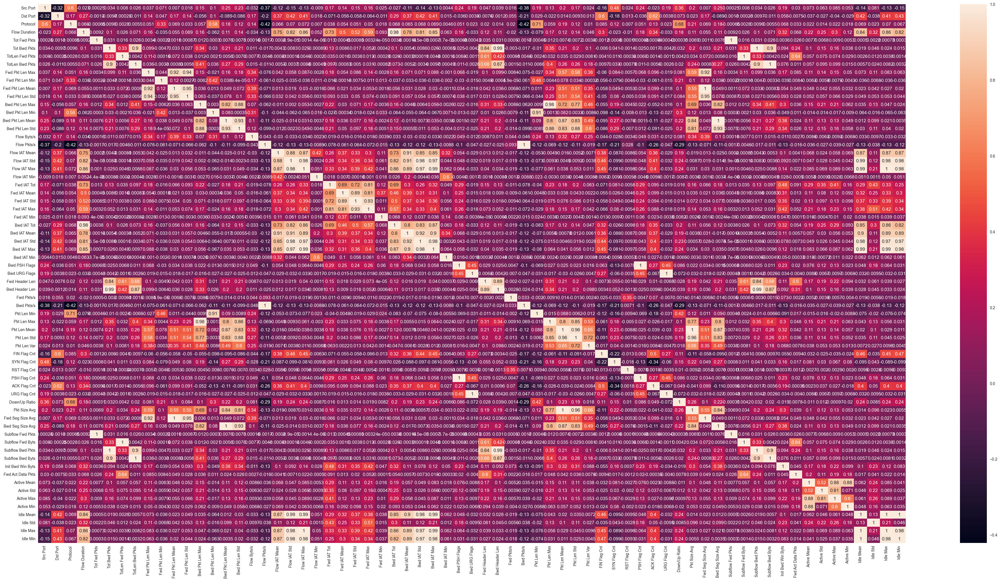

In [21]:
plt.figure(figsize=(50,25))
sns.heatmap(X.corr(),annot=True)

# Распределба на податоците

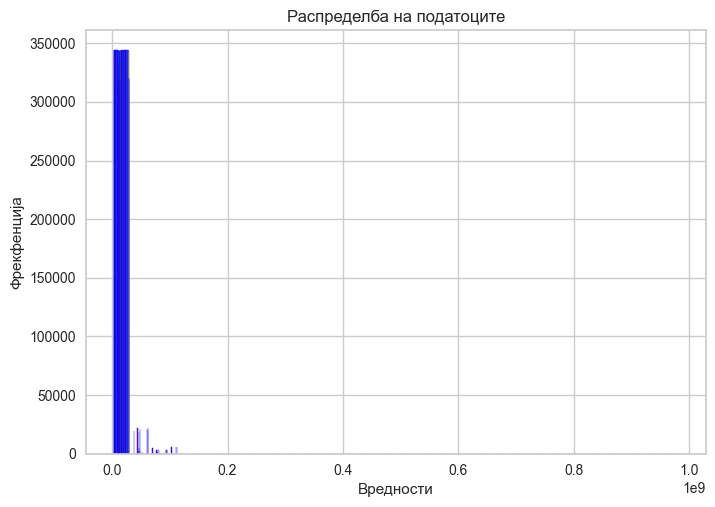

In [22]:
plt.hist(X, bins=30, edgecolor='blue')
plt.title('Распределба на податоците')
plt.xlabel('Вредности')
plt.ylabel('Фрекфенција')
plt.show()

## Shapiro-Wilk тест 

In [23]:
shapiro(X)

ShapiroResult(statistic=0.09100228548049927, pvalue=0.0)

pvalue = 0.0 < 0.5 не може да се претпостави дека е нормална дистрибуцијата на податоците

In [24]:
exp1 = setup(data,target='Attack',train_size=0.8,session_id=90,normalize=True,normalize_method='robust',transformation=True,transformation_method='yeo-johnson',fold_strategy='stratifiedkfold',fold=5)

,Description,Value
0,Session id,90
1,Target,Attack
2,Target type,Binary
3,Original data shape,"(343889, 68)"
4,Transformed data shape,"(343889, 68)"
5,Transformed train set shape,"(275111, 68)"
6,Transformed test set shape,"(68778, 68)"
7,Numeric features,67
8,Preprocess,True
9,Imputation type,simple


# Скалирање

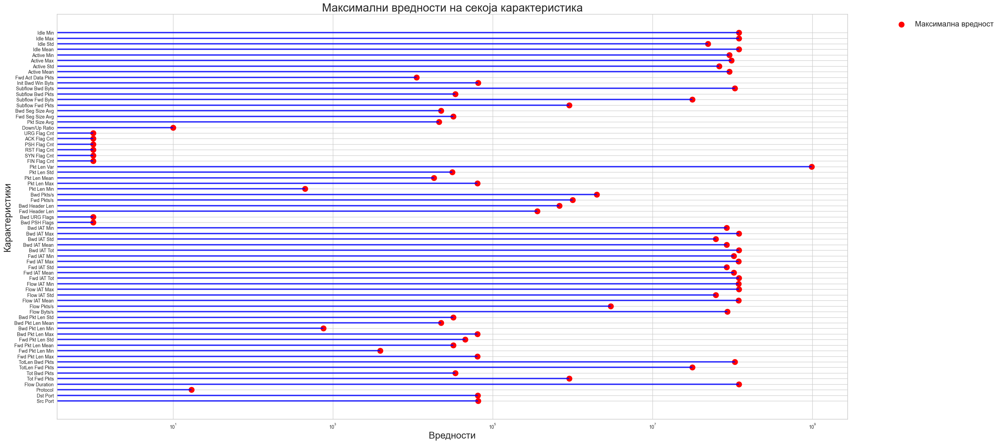

In [25]:
fig, ax = plt.subplots(figsize=(30, 15.5))

ax.scatter(get_config('X_train').max(), get_config('X_train').columns, color='red', marker='o', s=150, label='Максимална вредност')

for feature in get_config('X_train').columns:
    max_value = get_config('X_train')[feature].max()
    ax.hlines(y=feature, xmin=0, xmax=max_value, color='blue', linestyle='-', linewidth=3, alpha=0.8)
ax.set_xscale('log')
ax.set_xlabel('Вредности', fontsize=20)
ax.set_ylabel('Карактеристики', fontsize=20)
ax.set_title('Максимални вредности на секоја карактеристика', fontsize=24)

ax.legend(fontsize=16, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

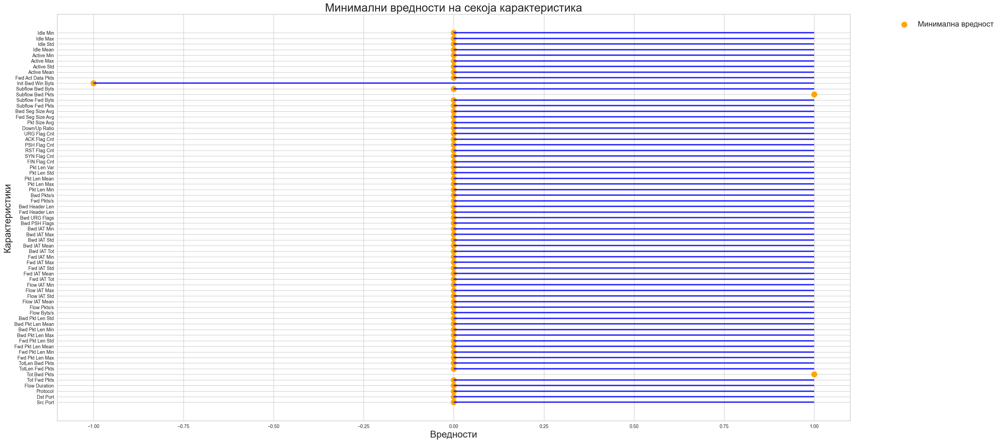

In [26]:
fig, ax = plt.subplots(figsize=(30, 15.5))
ax.scatter(get_config('X_train').min(), get_config('X_train').columns, color='orange', marker='o', s=150, label='Минимална вредност')



for feature in get_config('X_train').columns:
    min_value = get_config('X_train')[feature].min()
    ax.hlines(y=feature, xmin=1, xmax=min_value, color='blue', linestyle='-', linewidth=3, alpha=0.8)

ax.set_xlabel('Вредности', fontsize=20)
ax.set_ylabel('Карактеристики', fontsize=20)
ax.set_title('Минимални вредности на секоја карактеристика', fontsize=24)
ax.legend(fontsize=16, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

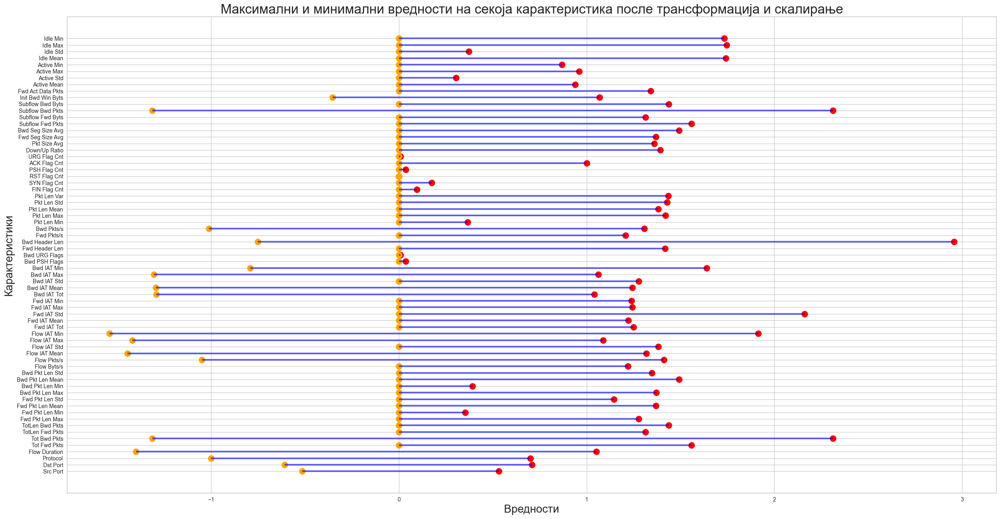

In [27]:
fig, ax = plt.subplots(figsize=(30, 15.5))
ax.scatter(get_config('X_train_transformed').max(), get_config('X_train_transformed').columns, color='red', marker='o', s=130, label='Максимална вредност')
ax.scatter(get_config('X_train_transformed').min(), get_config('X_train_transformed').columns, color='orange', marker='o', s=130, label='Минимална вредност')
for feature in get_config('X_train_transformed').columns:
    max_value = get_config('X_train_transformed')[feature].max()
    min_value = get_config('X_train_transformed')[feature].min()
    ax.hlines(y=feature, xmin=0, xmax=max_value, color='blue', linestyle='-', linewidth=3, alpha=0.6)
    ax.hlines(y=feature, xmin=0, xmax=min_value, color='blue', linestyle='-', linewidth=3, alpha=0.6)

ax.set_xlabel('Вредности', fontsize=20)
ax.set_ylabel('Карактеристики', fontsize=20)
ax.set_title('Mаксимални и минимални вредности на секоја карактеристика после трансформација и скалирање',fontsize=24)
plt.show()

# Трансформација на податоците со yeo-johnson

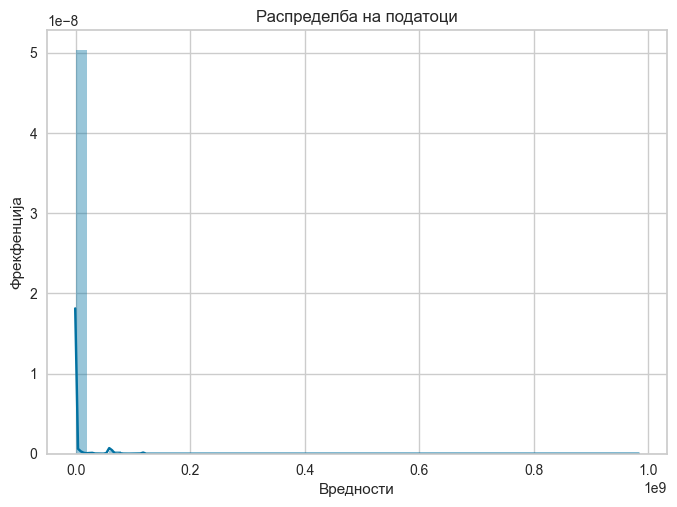

In [28]:
sns.distplot(get_config('X_train'))
plt.title('Распределба на податоци')
plt.xlabel('Вредности')
plt.ylabel('Фрекфенција')
plt.show()

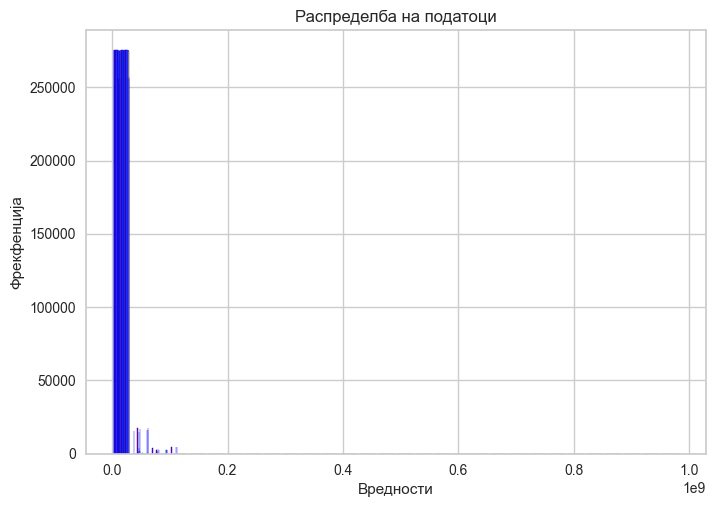

In [29]:
plt.hist(get_config('X_train'), bins=30, edgecolor='blue')
plt.title('Распределба на податоци')
plt.xlabel('Вредности')
plt.ylabel('Фрекфенција')
plt.show()

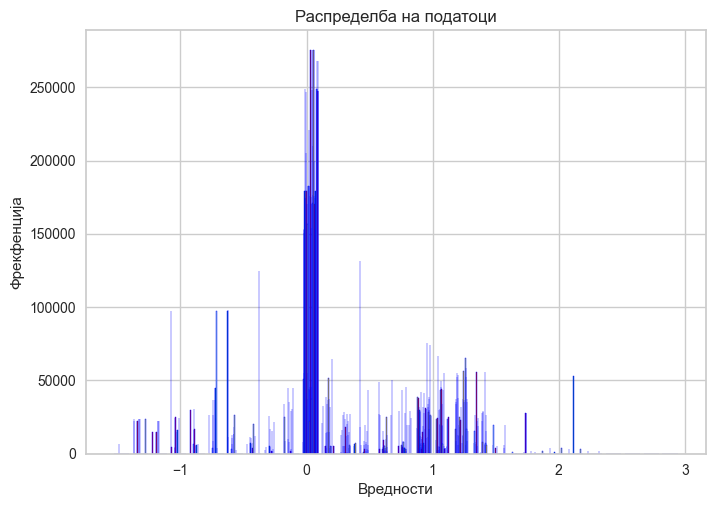

In [30]:
plt.hist(get_config('X_train_transformed'), bins=30, edgecolor='blue')
plt.title('Распределба на податоци')
plt.xlabel('Вредности')
plt.ylabel('Фрекфенција')
plt.show()

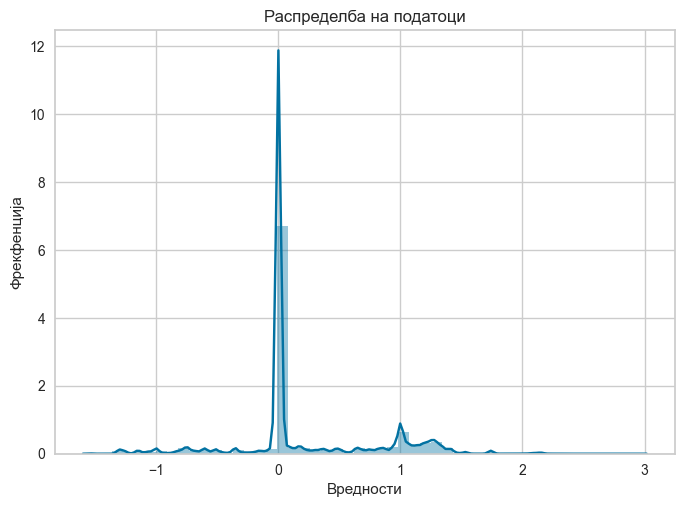

In [31]:
sns.distplot(get_config('X_train_transformed'))
plt.title('Распределба на податоци')
plt.xlabel('Вредности')
plt.ylabel('Фрекфенција')
plt.show()

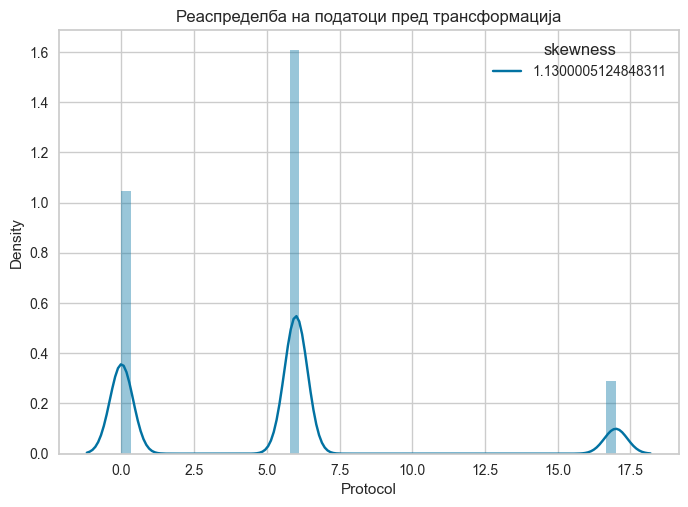

In [32]:
sns.distplot(get_config('X_train')["Protocol"])
plt.title("Реаспределба на податоци пред трансформација")
skewness=str(get_config('X_train')["Protocol"].skew())
plt.legend([skewness],title=("skewness"))

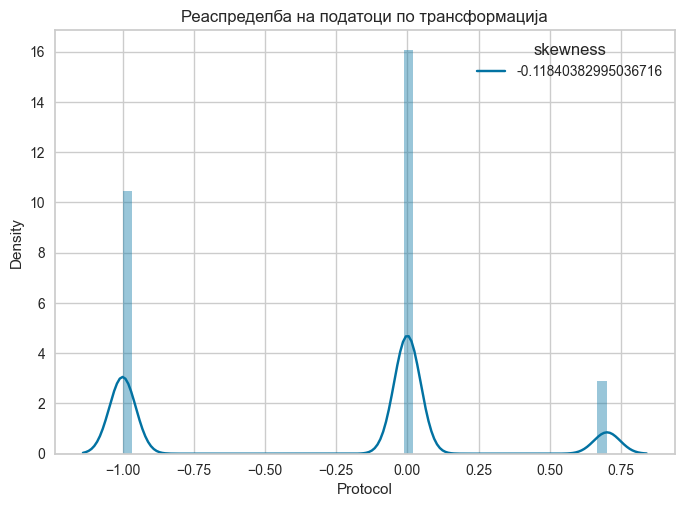

In [33]:
sns.distplot(get_config('X_train_transformed')["Protocol"])
plt.title("Реаспределба на податоци по трансформација")
skewness=str(get_config('X_train_transformed')["Protocol"].skew())
plt.legend([skewness],title=("skewness"))

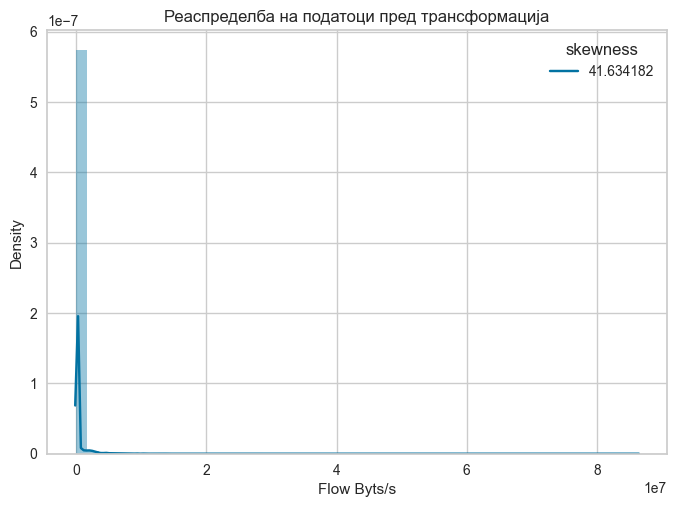

In [34]:
sns.distplot(get_config('X_train')["Flow Byts/s"])
plt.title("Реаспределба на податоци пред трансформација")
skewness=str(get_config('X_train')["Flow Byts/s"].skew())
plt.legend([skewness],title=("skewness"))

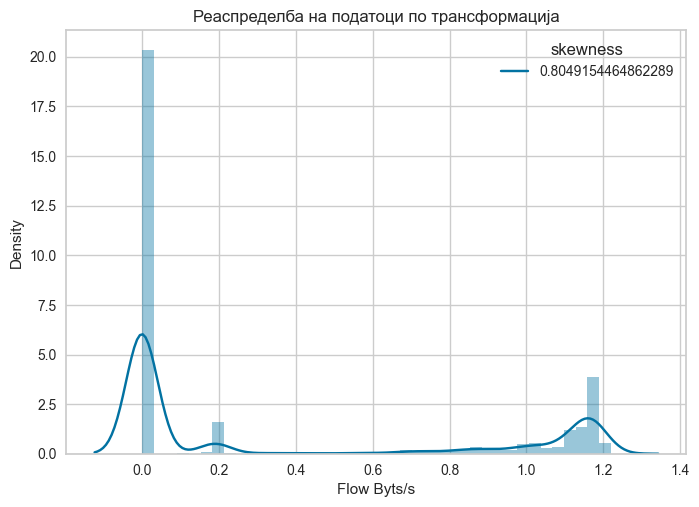

In [35]:
sns.distplot(get_config('X_train_transformed')["Flow Byts/s"])
plt.title("Реаспределба на податоци по трансформација")
skewness=str(get_config('X_train_transformed')["Flow Byts/s"].skew())
plt.legend([skewness],title=("skewness"))

# Boxplot

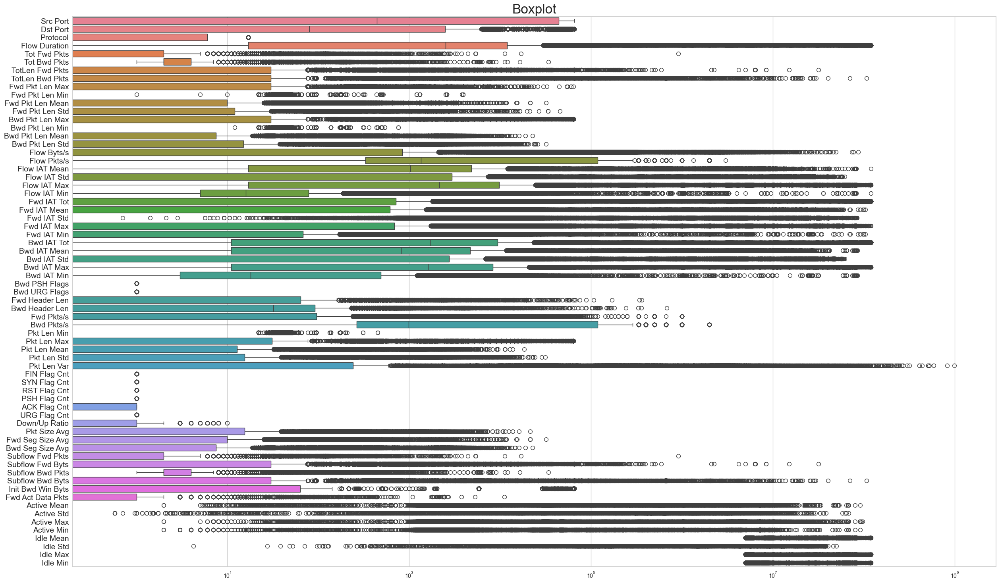

In [36]:
plt.figure(figsize=(30, 18))
sns.boxplot(data=get_config('X_train'), orient="h")
plt.title('Boxplot', fontsize=24)
plt.yticks(fontsize=14)
plt.xscale('log')
plt.show()

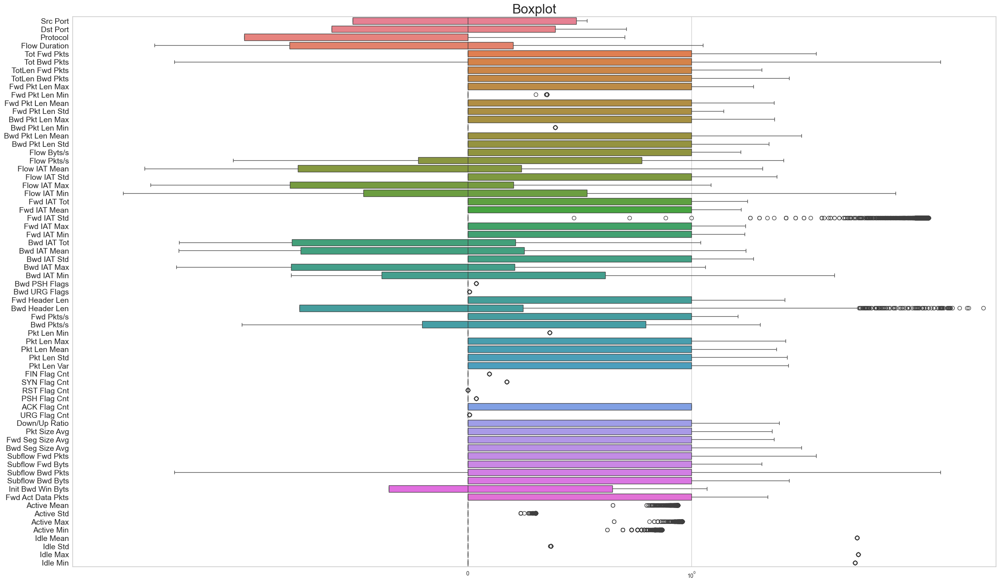

In [37]:
plt.figure(figsize=(30, 18))
sns.boxplot(data=get_config('X_train_transformed'), orient="h")
plt.title('Boxplot', fontsize=24)
plt.yticks(fontsize=14)
plt.xscale('symlog')
plt.show()

# Информација помеѓу карактеристиките и класите

In [57]:
information_gain = mutual_info_classif(get_config('X_train'), get_config('y_train'))

In [58]:
ig_dict = {}
for i in range(len(get_config('X_train').columns)):
    ig_dict[get_config('X_train').columns[i]] = information_gain[i]


ig_dict_sorted = dict(sorted(ig_dict.items(), key=lambda item: item[1], reverse=True))
n = 10
selected_features = list(ig_dict_sorted.keys())[:n]

print('Selected Features:')
print(selected_features)

Selected Features:
['Fwd Header Len', 'Bwd Header Len', 'Dst Port', 'Pkt Len Max', 'Pkt Len Std', 'Pkt Len Var', 'Pkt Len Mean', 'Pkt Size Avg', 'Bwd Seg Size Avg', 'Bwd Pkt Len Mean']


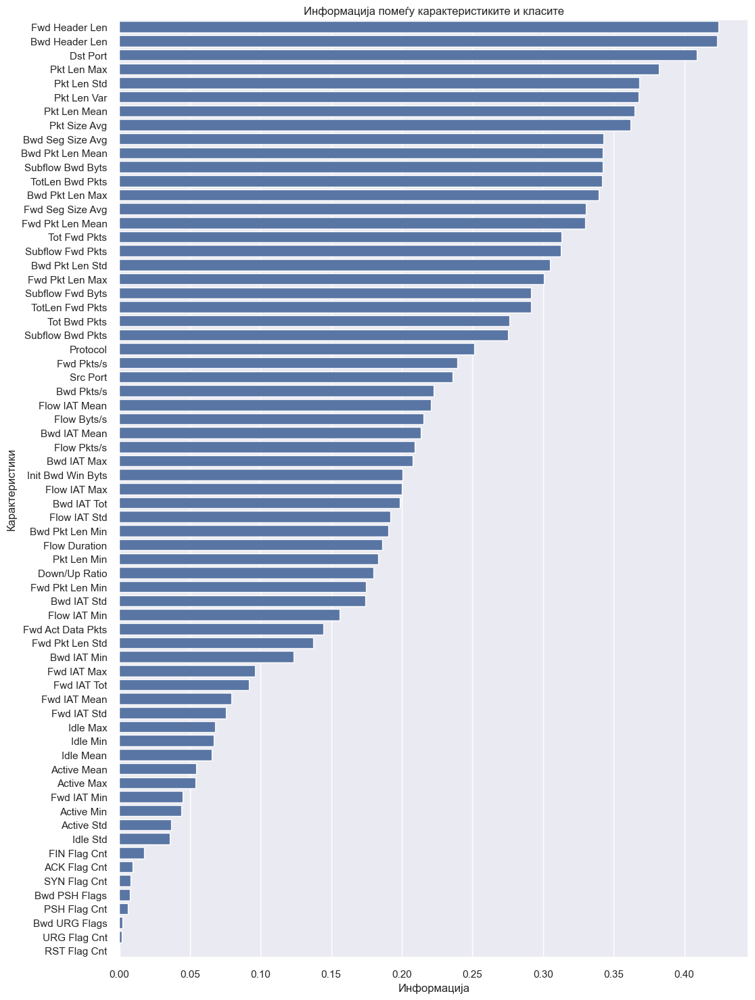

In [59]:
sns.set(style="whitegrid")
sns.set(rc={'figure.figsize':(12,18)})
sns.barplot(x=list(ig_dict_sorted.values()), y=list(ig_dict_sorted.keys()))
plt.title('Информација помеѓу карактеристиките и класите')
plt.xlabel('Информација')
plt.ylabel('Карактеристики')
plt.show()

In [38]:
information_gain = mutual_info_classif(get_config('X_train_transformed'), get_config('y_train_transformed'))

In [39]:
ig_dict = {}
for i in range(len(get_config('X_train_transformed').columns)):
    ig_dict[get_config('X_train_transformed').columns[i]] = information_gain[i]


ig_dict_sorted = dict(sorted(ig_dict.items(), key=lambda item: item[1], reverse=True))
n = 10
selected_features = list(ig_dict_sorted.keys())[:n]

print('Selected Features:')
print(selected_features)

Selected Features:
['Bwd Header Len', 'Fwd Header Len', 'Dst Port', 'Pkt Len Max', 'Pkt Len Std', 'Pkt Len Var', 'Pkt Len Mean', 'Pkt Size Avg', 'Bwd Seg Size Avg', 'Subflow Bwd Byts']


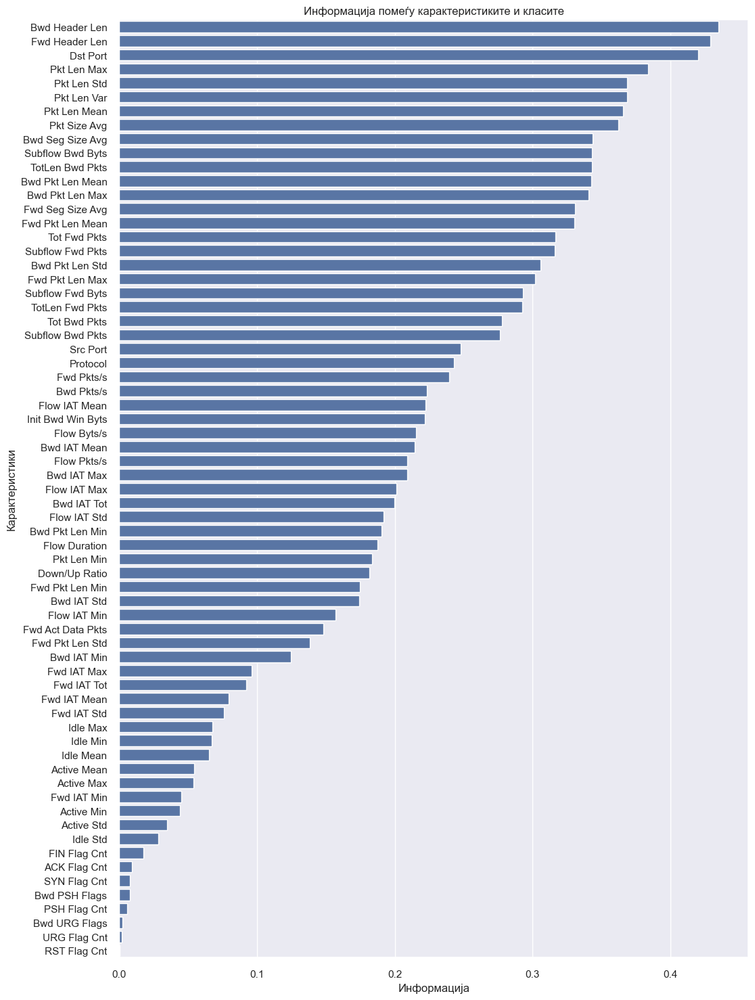

In [40]:
sns.set(style="whitegrid")
sns.set(rc={'figure.figsize':(12,18)})
sns.barplot(x=list(ig_dict_sorted.values()), y=list(ig_dict_sorted.keys()))
plt.title('Информација помеѓу карактеристиките и класите')
plt.xlabel('Информација')
plt.ylabel('Карактеристики')
plt.show()

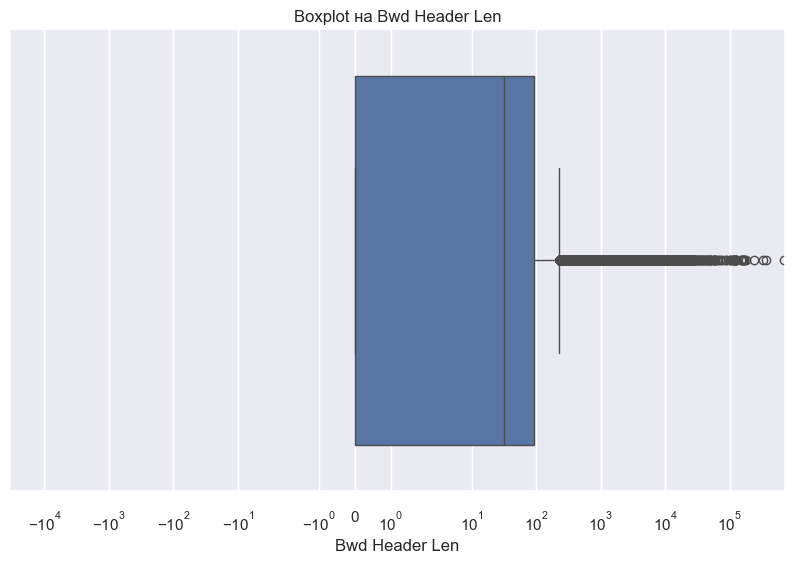

In [41]:
feature = 'Bwd Header Len'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train')[feature])
plt.title(f'Boxplot на {feature}')
plt.xscale('symlog') 
plt.show()

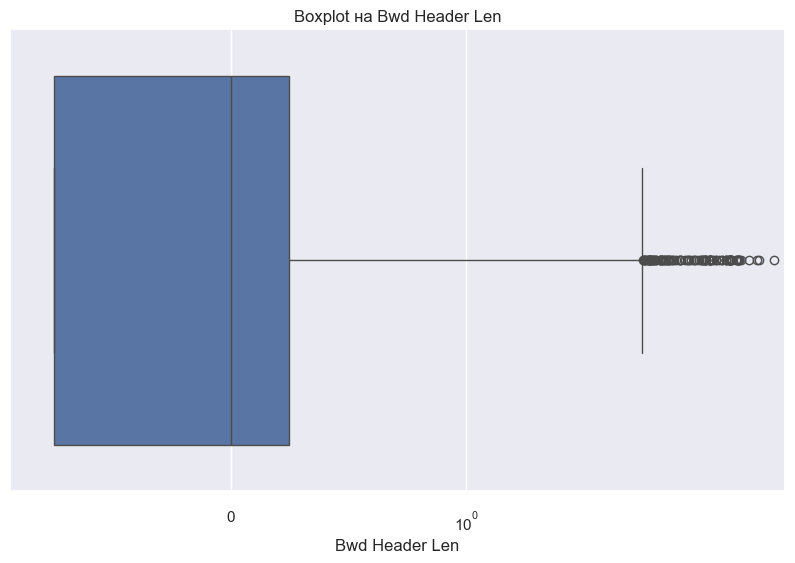

In [42]:
feature = 'Bwd Header Len'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train_transformed')[feature])
plt.title(f'Boxplot на {feature}')
plt.xscale('symlog') 
plt.show()

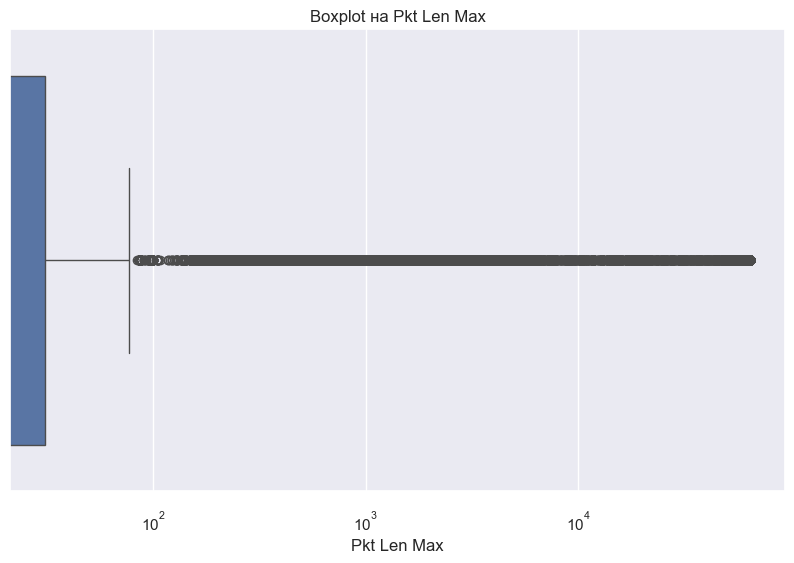

In [43]:
feature = 'Pkt Len Max'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train')[feature])
plt.title(f'Boxplot на {feature}')
plt.xscale('log') 
plt.show()

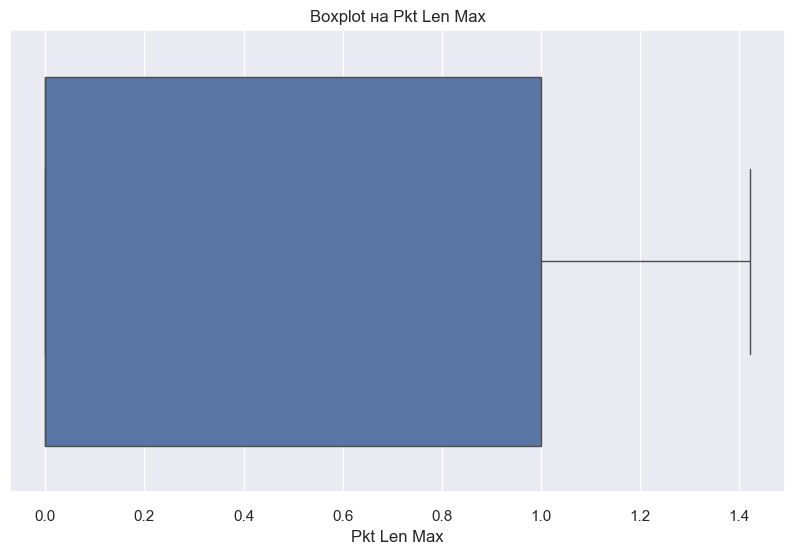

In [44]:
feature = 'Pkt Len Max'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train_transformed')[feature])
plt.title(f'Boxplot на {feature}')
plt.show()

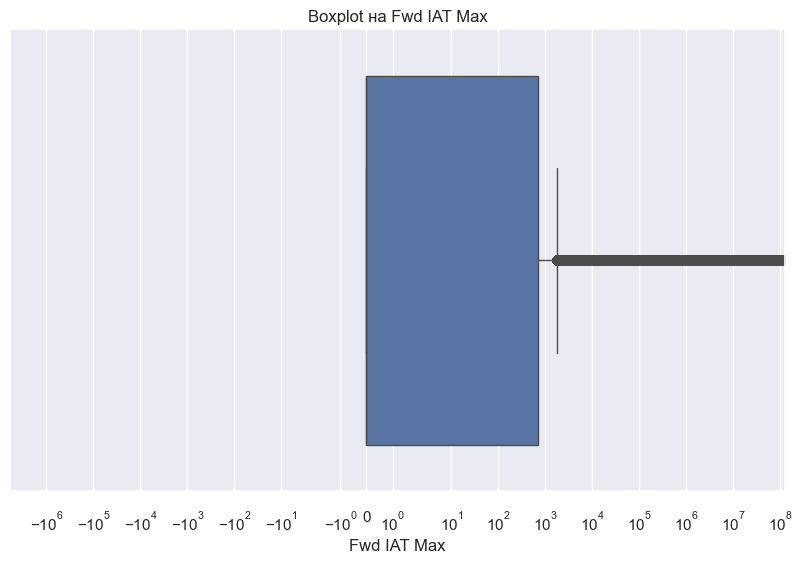

In [45]:
feature = 'Fwd IAT Max'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train')[feature])
plt.title(f'Boxplot на {feature}')
plt.xscale('symlog') 
plt.show()

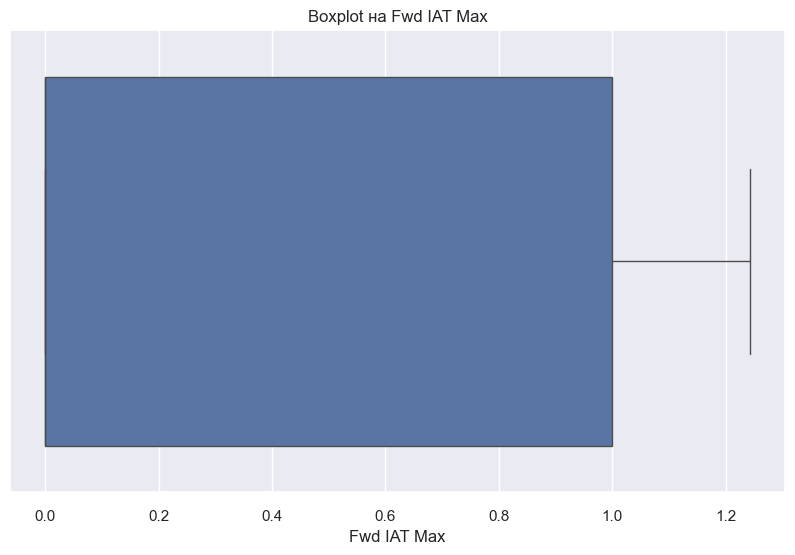

In [46]:
feature = 'Fwd IAT Max'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train_transformed')[feature])
plt.title(f'Boxplot на {feature}')
plt.show()

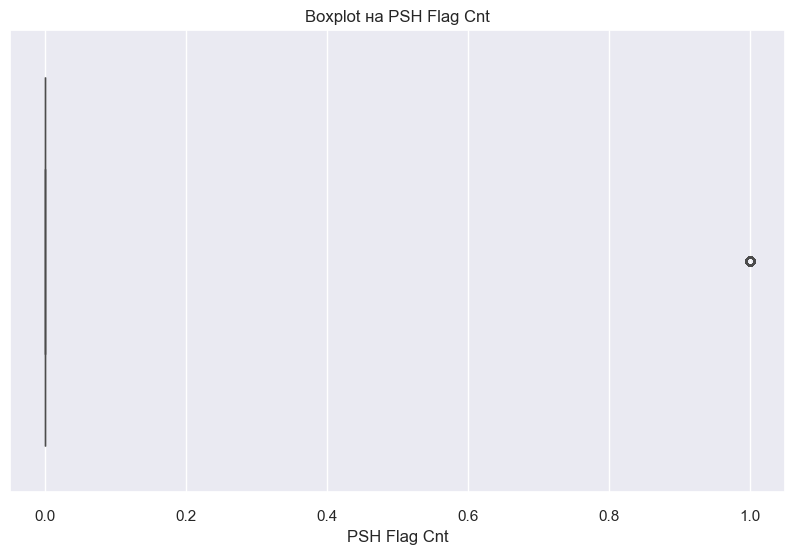

In [47]:
feature = 'PSH Flag Cnt'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train')[feature])
plt.title(f'Boxplot на {feature}')
plt.show()

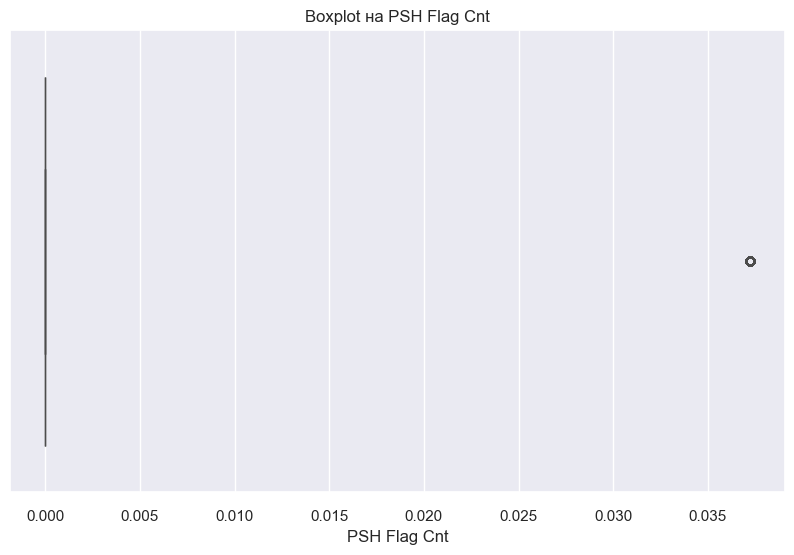

In [48]:
feature = 'PSH Flag Cnt'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train_transformed')[feature])
plt.title(f'Boxplot на {feature}')
plt.show()

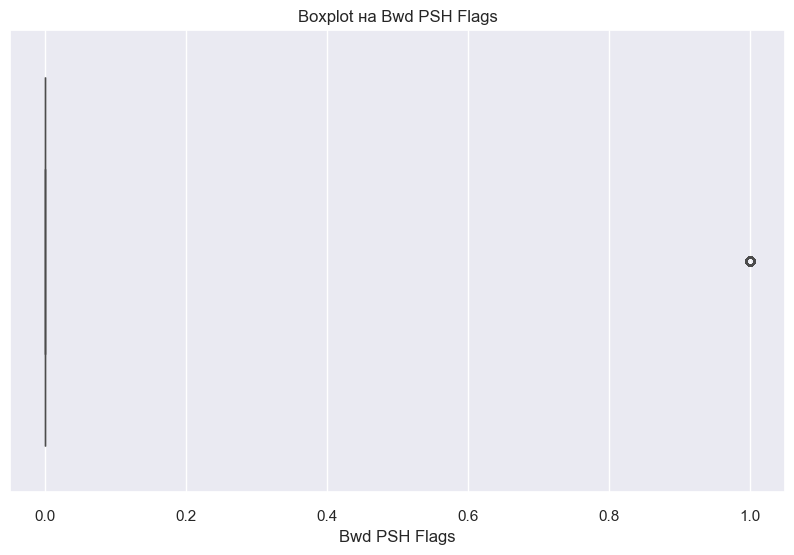

In [49]:
feature = 'Bwd PSH Flags'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train')[feature])
plt.title(f'Boxplot на {feature}')
plt.show()

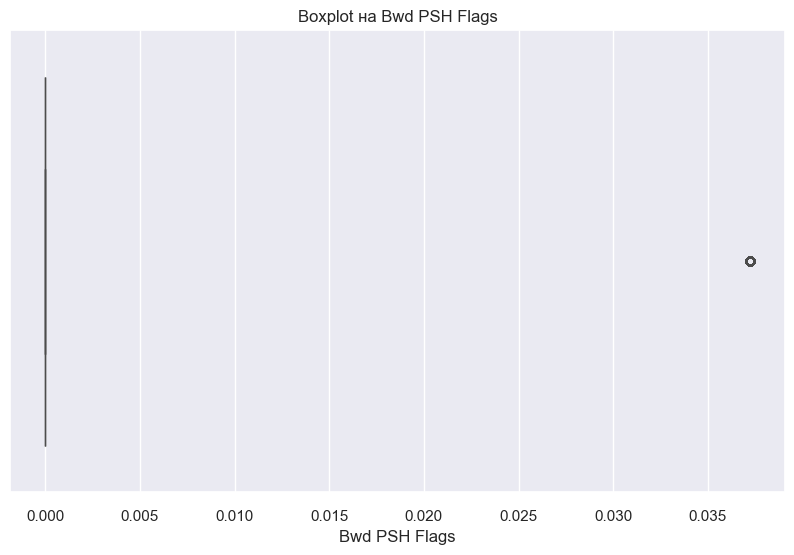

In [50]:
feature = 'Bwd PSH Flags'
plt.figure(figsize=(10, 6))  
sns.boxplot(x=get_config('X_train_transformed')[feature])
plt.title(f'Boxplot на {feature}')
plt.show()

In [51]:
get_config('X_train').min().min()

-1.0

In [52]:
get_config('X_train').max().max()

983000000.0

In [53]:

get_config('X_train_transformed').min().min()

-1.5419062894700077

In [54]:
get_config('X_train_transformed').max().max()

2.9573755700659636

In [55]:
get_config('y_train').value_counts()

1    220372
0     54739
Name: Attack, dtype: int64

# Тренирање и тестирање на модели

In [11]:
best = compare_models(include=['lr','rf','dt','knn','svm','ada','nb','xgboost'])

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,20:39:59
Status,. . . . . . . . . . . . . . . . . .,Loading Estimator
Estimator,. . . . . . . . . . . . . . . . . .,Logistic Regression


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9999,1.0000,1.0000,0.9999,1.0000,0.9997,0.9997,15.2440
xgboost,Extreme Gradient Boosting,0.9999,1.0000,1.0000,0.9999,0.9999,0.9997,0.9997,8.7480
dt,Decision Tree Classifier,0.9998,0.9996,0.9999,0.9998,0.9999,0.9994,0.9994,8.4100
knn,K Neighbors Classifier,0.9996,0.9997,0.9998,0.9997,0.9998,0.9988,0.9988,40.5000
ada,Ada Boost Classifier,0.9990,1.0000,0.9993,0.9994,0.9994,0.9968,0.9968,16.5700
lr,Logistic Regression,0.9950,0.9992,0.9966,0.9972,0.9969,0.9844,0.9844,13.4660
svm,SVM - Linear Kernel,0.9920,0.0000,0.9926,0.9974,0.9950,0.9751,0.9752,6.7360
nb,Naive Bayes,0.7842,0.9003,0.7639,0.9583,0.8501,0.4820,0.5235,6.7260


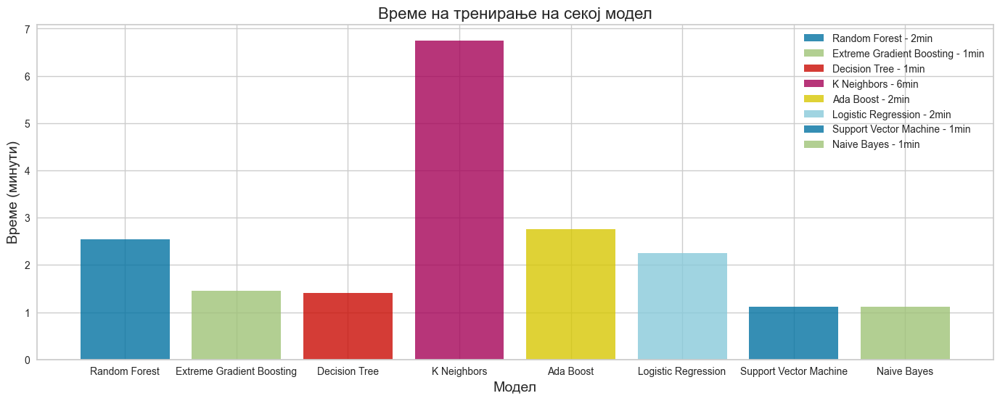

In [87]:
models = ['Random Forest', 'Extreme Gradient Boosting', 'Decision Tree', 'K Neighbors', 'Ada Boost', 'Logistic Regression', 'Support Vector Machine', 'Naive Bayes']
tt_seconds = [152.44, 87.48, 84.10, 405.00, 165.70, 134.66, 67.36, 67.26]
tt_minutes = [second/60 for second in tt_seconds] 


plt.figure(figsize=(17, 6))

for model, tt_sec in zip(models, tt_minutes):
    plt.bar(model, tt_sec, label=f'{model} - {int(tt_sec)}min', alpha=0.8)

plt.title('Време на тренирање на секој модел',fontsize=16)
plt.xlabel('Модел',fontsize=14)
plt.ylabel('Време (минути)',fontsize=14)
plt.legend()
plt.show()

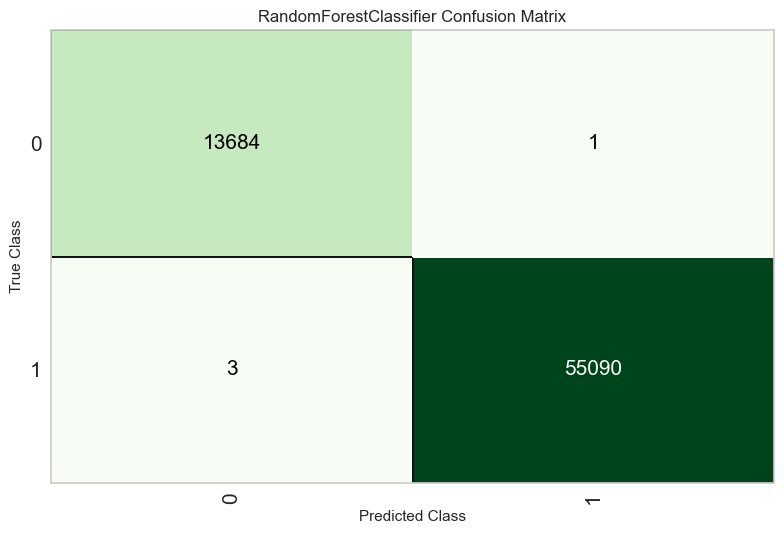

In [12]:
plot_model(best, plot = 'confusion_matrix')

In [13]:
evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [14]:
predict = predict_model(best)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.9999,1.0000,0.9999,1.0000,1.0000,0.9998,0.9998


In [15]:
print(best)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=90, verbose=0, warm_start=False)


In [16]:
p = predict['prediction_label']

In [17]:
test_y = get_config('y_test')

In [19]:
print(classification_report(test_y,p))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13685
           1       1.00      1.00      1.00     55093

    accuracy                           1.00     68778
   macro avg       1.00      1.00      1.00     68778
weighted avg       1.00      1.00      1.00     68778



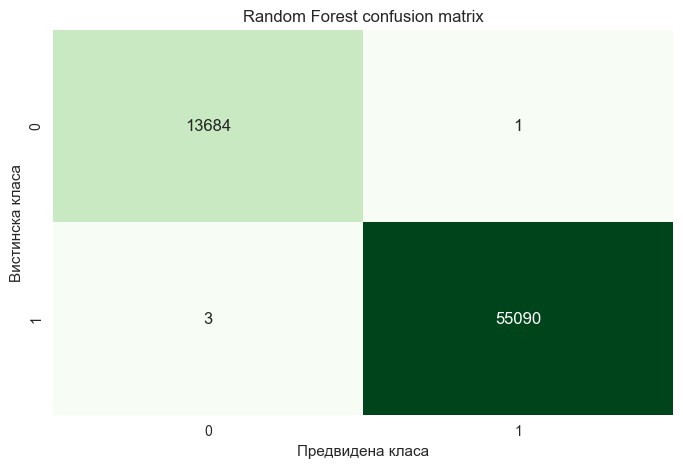

In [85]:
from sklearn.metrics import confusion_matrix
conf_matrix = confusion_matrix(test_y, p)
conf_df = pd.DataFrame(conf_matrix, index=[0,1],columns=[0,1])
plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('Random Forest confusion matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

In [21]:
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9998,0.9995,0.9999,0.9998,0.9999,0.9993,0.9993
1,0.9998,0.9997,0.9999,0.9999,0.9999,0.9995,0.9995
2,0.9999,0.9998,0.9999,0.9999,0.9999,0.9996,0.9996
3,0.9997,0.9994,0.9999,0.9997,0.9998,0.9991,0.9991
4,0.9998,0.9997,0.9999,0.9999,0.9999,0.9994,0.9994
Mean,0.9998,0.9996,0.9999,0.9998,0.9999,0.9994,0.9994
Std,0.0001,0.0002,0.0000,0.0001,0.0000,0.0002,0.0002


In [22]:
pr =  predict_model(dt)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.9999,0.9999,0.9999,1.0000,0.9999,0.9997,0.9997


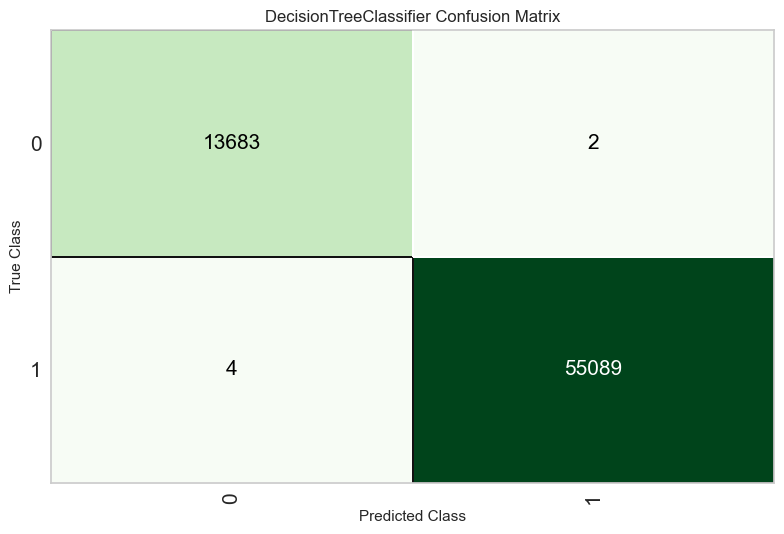

In [23]:
plot_model(dt, plot = 'confusion_matrix')

In [24]:
p_dt = pr['prediction_label']

In [26]:
print(classification_report(test_y,p_dt))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13685
           1       1.00      1.00      1.00     55093

    accuracy                           1.00     68778
   macro avg       1.00      1.00      1.00     68778
weighted avg       1.00      1.00      1.00     68778



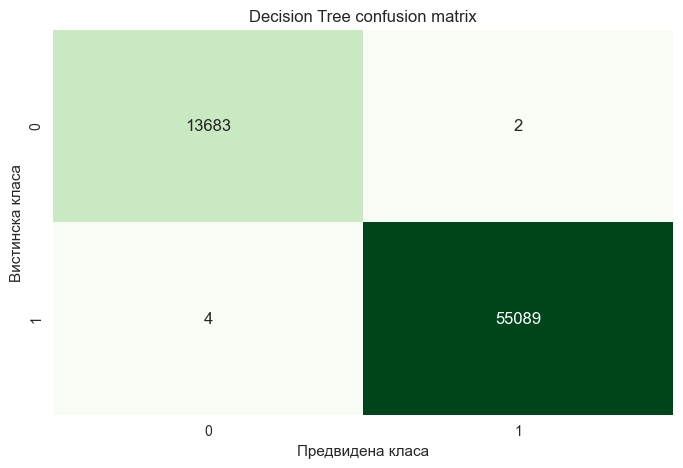

In [84]:
conf_matrix = confusion_matrix(test_y, p_dt)
conf_df = pd.DataFrame(conf_matrix, index=[0,1], columns=[0,1])
plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('Decision Tree confusion matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

In [28]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9945,0.9992,0.9960,0.9971,0.9966,0.9828,0.9828
1,0.9953,0.9992,0.9970,0.9971,0.9971,0.9852,0.9852
2,0.9950,0.9991,0.9966,0.9971,0.9969,0.9843,0.9843
3,0.9955,0.9991,0.9969,0.9974,0.9972,0.9859,0.9859
4,0.9949,0.9992,0.9966,0.9970,0.9968,0.9842,0.9842
Mean,0.9950,0.9992,0.9966,0.9972,0.9969,0.9844,0.9844
Std,0.0003,0.0000,0.0004,0.0001,0.0002,0.0011,0.0011


In [29]:
pl = predict_model(lr)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.9953,0.9995,0.9968,0.9973,0.9971,0.9854,0.9854


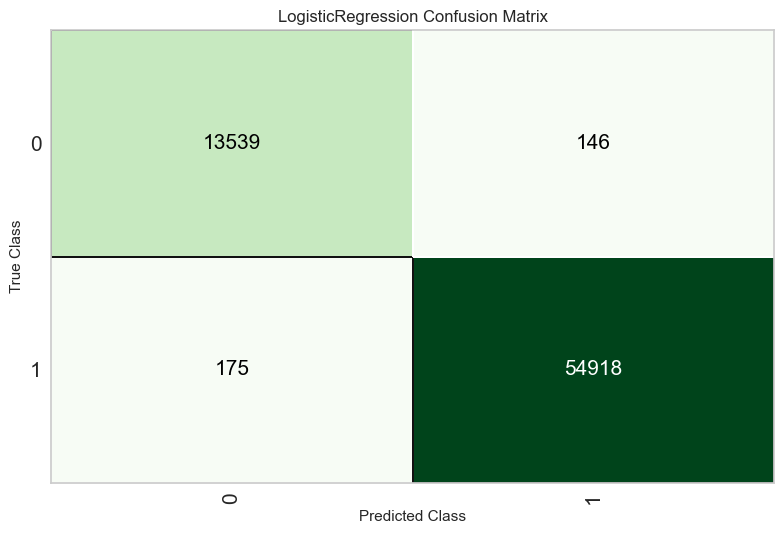

In [30]:
plot_model(lr, plot = 'confusion_matrix')

In [31]:
p_lr = pl['prediction_label']

In [33]:

print(classification_report(test_y,p_lr))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     13685
           1       1.00      1.00      1.00     55093

    accuracy                           1.00     68778
   macro avg       0.99      0.99      0.99     68778
weighted avg       1.00      1.00      1.00     68778



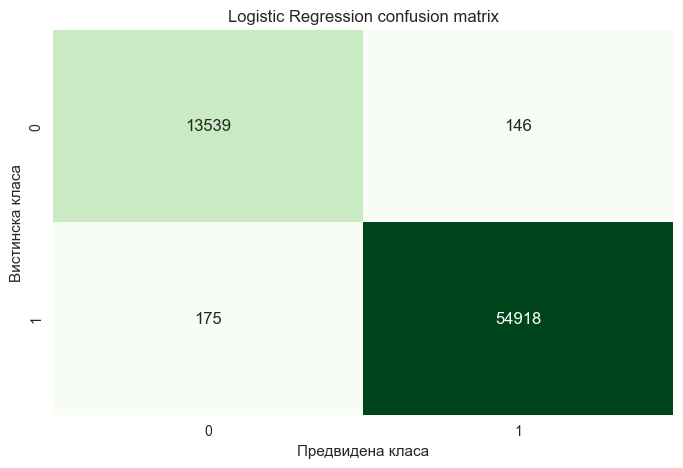

In [83]:
conf_matrix = confusion_matrix(test_y, p_lr)
conf_df = pd.DataFrame(conf_matrix, index=[0,1], columns=[0,1])
plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('Logistic Regression confusion matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

In [35]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9997,0.9999,0.9998,0.9998,0.9998,0.9989,0.9989
1,0.9995,0.9997,0.9998,0.9996,0.9997,0.9986,0.9986
2,0.9997,0.9999,0.9998,0.9998,0.9998,0.9992,0.9992
3,0.9994,0.9996,0.9997,0.9996,0.9996,0.9982,0.9982
4,0.9996,0.9997,0.9997,0.9998,0.9998,0.9989,0.9989
Mean,0.9996,0.9997,0.9998,0.9997,0.9998,0.9988,0.9988
Std,0.0001,0.0001,0.0001,0.0001,0.0001,0.0003,0.0003


In [36]:
p_kn=predict_model(knn)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,K Neighbors Classifier,0.9996,0.9998,0.9998,0.9998,0.9998,0.9989,0.9989


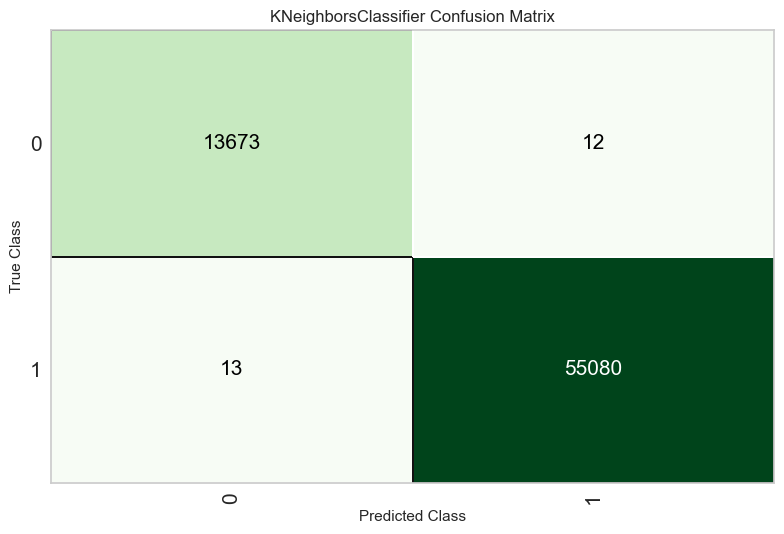

In [37]:
plot_model(knn, plot = 'confusion_matrix')

In [38]:
p_knn= p_kn['prediction_label']

In [40]:
print(classification_report(test_y,p_knn))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13685
           1       1.00      1.00      1.00     55093

    accuracy                           1.00     68778
   macro avg       1.00      1.00      1.00     68778
weighted avg       1.00      1.00      1.00     68778



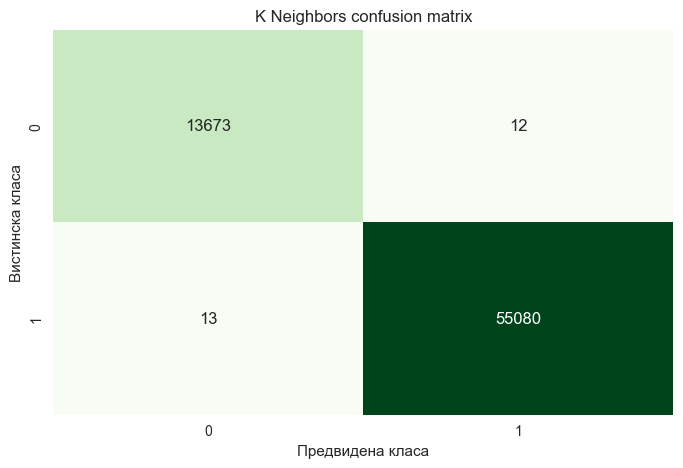

In [82]:
conf_matrix = confusion_matrix(test_y, p_knn)
conf_df = pd.DataFrame(conf_matrix, index=[0,1], columns=[0,1])
plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('K Neighbors confusion matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

In [42]:
nb = create_model('nb')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7843,0.8990,0.7647,0.9575,0.8503,0.4814,0.5222
1,0.7849,0.8992,0.7655,0.9574,0.8508,0.4821,0.5228
2,0.7858,0.9027,0.7649,0.9596,0.8512,0.4859,0.5277
3,0.7813,0.9010,0.7597,0.9587,0.8477,0.4778,0.5206
4,0.7848,0.8996,0.7647,0.9582,0.8506,0.4828,0.5240
Mean,0.7842,0.9003,0.7639,0.9583,0.8501,0.4820,0.5235
Std,0.0015,0.0014,0.0021,0.0008,0.0013,0.0026,0.0024


In [43]:
pnb = predict_model(nb)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Naive Bayes,0.7798,0.9021,0.7572,0.9593,0.8463,0.4760,0.5197


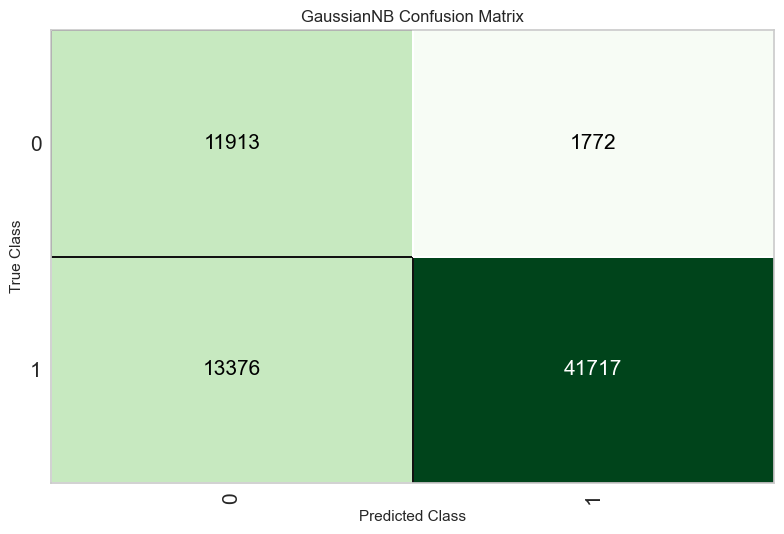

In [44]:
plot_model(nb, plot = 'confusion_matrix')

In [45]:
p_nb= pnb['prediction_label']

In [46]:

print(classification_report(test_y,p_nb))

              precision    recall  f1-score   support

           0       0.47      0.87      0.61     13685
           1       0.96      0.76      0.85     55093

    accuracy                           0.78     68778
   macro avg       0.72      0.81      0.73     68778
weighted avg       0.86      0.78      0.80     68778



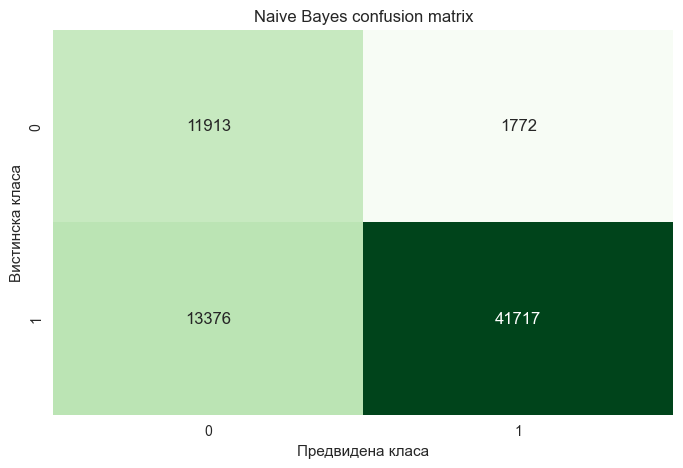

In [81]:
conf_matrix = confusion_matrix(test_y, p_nb)
conf_df = pd.DataFrame(conf_matrix, index=[0,1], columns=[0,1])
plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('Naive Bayes confusion matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

In [49]:
ada = create_model('ada')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9987,1.0000,0.9992,0.9992,0.9992,0.9959,0.9959
1,0.9989,1.0000,0.9992,0.9994,0.9993,0.9966,0.9966
2,0.9995,1.0000,0.9996,0.9998,0.9997,0.9985,0.9985
3,0.9987,0.9999,0.9992,0.9992,0.9992,0.9960,0.9960
4,0.9991,1.0000,0.9995,0.9994,0.9994,0.9972,0.9972
Mean,0.9990,1.0000,0.9993,0.9994,0.9994,0.9968,0.9968
Std,0.0003,0.0000,0.0002,0.0002,0.0002,0.0010,0.0010


In [50]:
p_ada=predict_model(ada)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ada Boost Classifier,0.9995,1.0000,0.9998,0.9996,0.9997,0.9984,0.9984


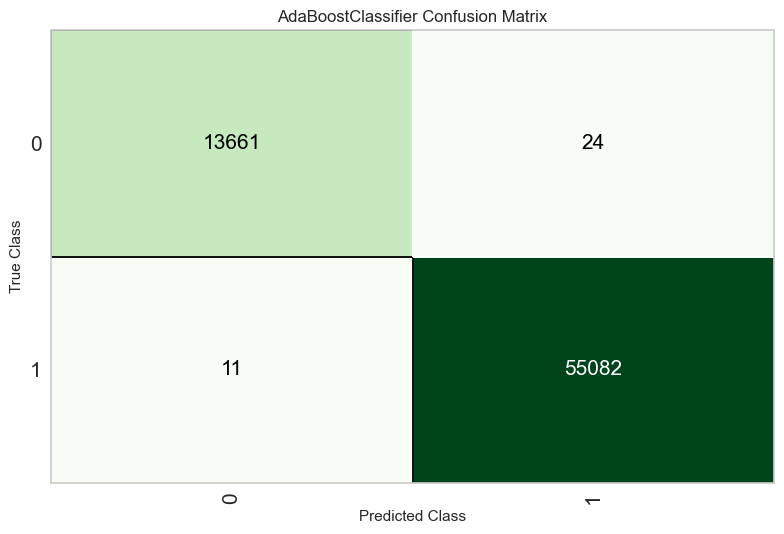

In [51]:
plot_model(ada, plot = 'confusion_matrix')

In [52]:
p_ada= p_ada['prediction_label']

In [53]:

print(classification_report(test_y,p_ada))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13685
           1       1.00      1.00      1.00     55093

    accuracy                           1.00     68778
   macro avg       1.00      1.00      1.00     68778
weighted avg       1.00      1.00      1.00     68778



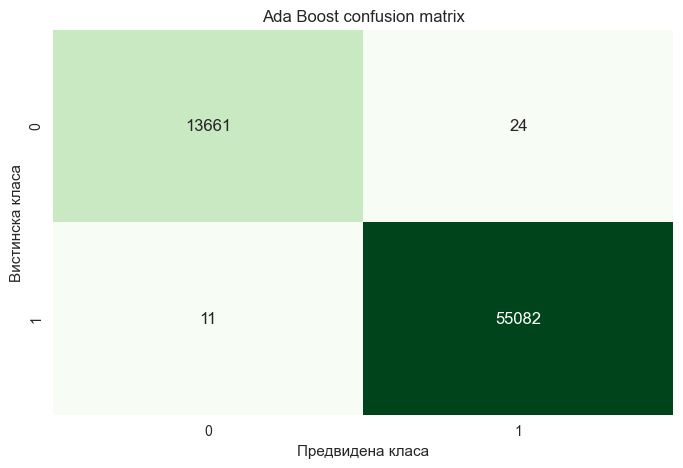

In [80]:
conf_matrix = confusion_matrix(test_y, p_ada)
conf_df = pd.DataFrame(conf_matrix, index=[0,1], columns=[0,1])
plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('Ada Boost confusion matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

In [56]:
xgboost=create_model('xgboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9999,1.0000,1.0000,0.9999,0.9999,0.9995,0.9995
1,0.9999,1.0000,1.0000,0.9999,0.9999,0.9997,0.9997
2,0.9999,1.0000,1.0000,1.0000,1.0000,0.9998,0.9998
3,0.9999,1.0000,1.0000,0.9998,0.9999,0.9995,0.9995
4,1.0000,1.0000,1.0000,1.0000,1.0000,0.9999,0.9999
Mean,0.9999,1.0000,1.0000,0.9999,0.9999,0.9997,0.9997
Std,0.0000,0.0000,0.0000,0.0000,0.0000,0.0001,0.0001


In [58]:
p_xgb=predict_model(xgboost)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,1.0000,1.0000,1.0000,1.0000,1.0000,0.9999,0.9999


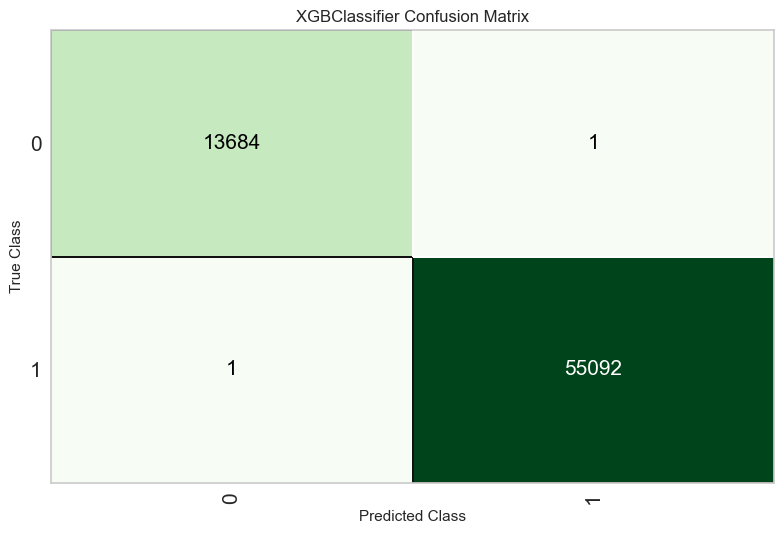

In [59]:
plot_model(xgboost, plot = 'confusion_matrix')

In [60]:
p_xgb = p_xgb['prediction_label']

In [61]:
print(classification_report(test_y,p_xgb))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13685
           1       1.00      1.00      1.00     55093

    accuracy                           1.00     68778
   macro avg       1.00      1.00      1.00     68778
weighted avg       1.00      1.00      1.00     68778



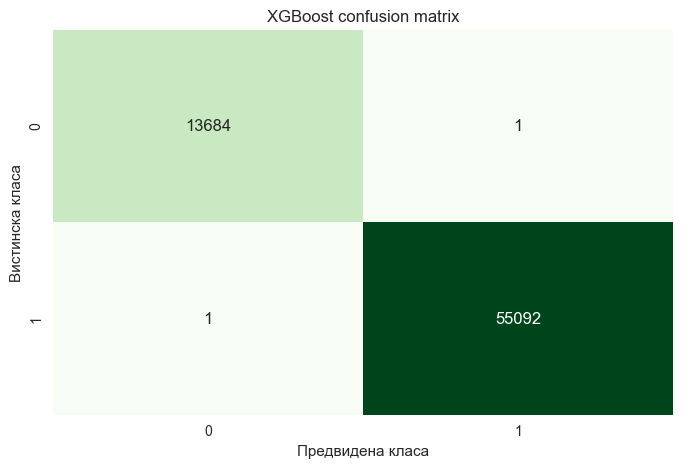

In [79]:
conf_matrix = confusion_matrix(test_y, p_xgb)
conf_df = pd.DataFrame(conf_matrix, index=[0,1], columns=[0,1])
plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('XGBoost confusion matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

In [64]:
svm = create_model('svm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9919,0.0000,0.9917,0.9981,0.9949,0.9747,0.9748
1,0.9917,0.0000,0.9919,0.9977,0.9948,0.9741,0.9742
2,0.9920,0.0000,0.9924,0.9976,0.9950,0.9751,0.9751
3,0.9929,0.0000,0.9947,0.9965,0.9956,0.9778,0.9778
4,0.9916,0.0000,0.9923,0.9972,0.9947,0.9739,0.9739
Mean,0.9920,0.0000,0.9926,0.9974,0.9950,0.9751,0.9752
Std,0.0005,0.0000,0.0011,0.0005,0.0003,0.0014,0.0014


In [65]:
p_svm = predict_model(svm)

In [66]:
p_svm = predict_model(svm)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.9917,0.9919,0.9915,0.9981,0.9948,0.9741,0.9743


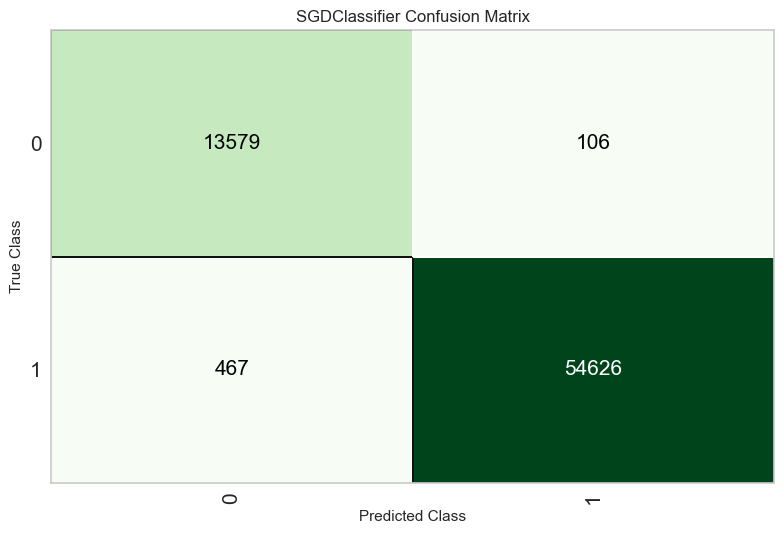

In [67]:
plot_model(svm, plot = 'confusion_matrix')

In [68]:
p_svm = p_svm['prediction_label']

In [69]:
print(classification_report(test_y,p_svm))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98     13685
           1       1.00      0.99      0.99     55093

    accuracy                           0.99     68778
   macro avg       0.98      0.99      0.99     68778
weighted avg       0.99      0.99      0.99     68778



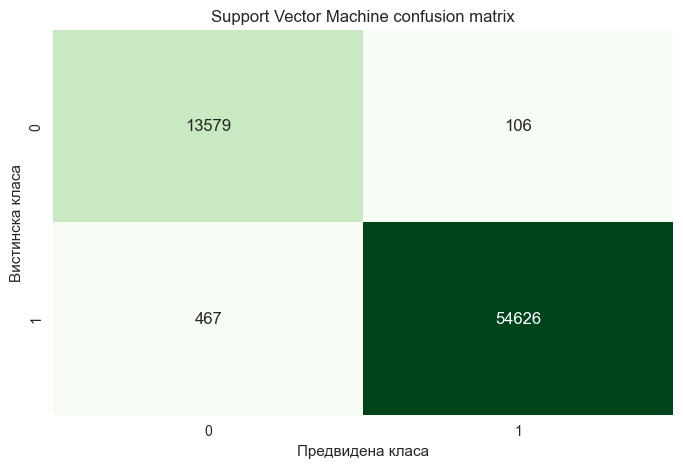

In [78]:
conf_matrix = confusion_matrix(test_y, p_svm)
conf_df = pd.DataFrame(conf_matrix, index=[0,1], columns=[0,1])
plt.figure(figsize=(8, 5))
sns.heatmap(conf_df, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.title('Support Vector Machine confusion matrix')
plt.xlabel('Предвидена класа')
plt.ylabel('Вистинска класа')
plt.show()

In [72]:
finalize_best = finalize_model(best)

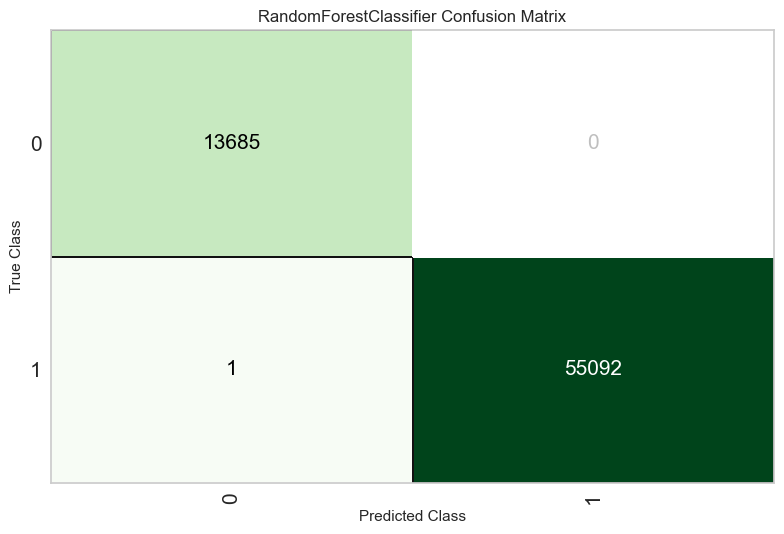

In [73]:
plot_model(finalize_best, plot = 'confusion_matrix')

In [74]:
save_model(finalize_best,'FinalizedModelBinary_')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['Src Port', 'Dst Port', 'Protocol',
                                              'Flow Duration', 'Tot Fwd Pkts',
                                              'Tot Bwd Pkts', 'TotLen Fwd Pkts',
                                              'TotLen Bwd Pkts',
                                              'Fwd Pkt Len Max',
                                              'Fwd Pkt Len Min',
                                              'Fwd Pkt Len Mean',
                                              'Fwd Pkt Len Std',
                                              'Bwd Pkt Len Max',
                                              'Bwd Pkt Len Min',
                                              'Bwd Pkt Len Mean',
                                              'Bwd Pkt Len Std', 'Flow Byts/s',
                          

In [75]:
save_experiment('BinaryClassification_')

In [76]:
save_model(best,'BestModelBinary')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['Src Port', 'Dst Port', 'Protocol',
                                              'Flow Duration', 'Tot Fwd Pkts',
                                              'Tot Bwd Pkts', 'TotLen Fwd Pkts',
                                              'TotLen Bwd Pkts',
                                              'Fwd Pkt Len Max',
                                              'Fwd Pkt Len Min',
                                              'Fwd Pkt Len Mean',
                                              'Fwd Pkt Len Std',
                                              'Bwd Pkt Len Max',
                                              'Bwd Pkt Len Min',
                                              'Bwd Pkt Len Mean',
                                              'Bwd Pkt Len Std', 'Flow Byts/s',
                          